In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import cv2
import sklearn
import PIL
import torch
import torchvision
from matplotlib import cm

import warnings
warnings.filterwarnings('ignore')

### Зачем
- Посмотрим, как проводится операция свертки;
- Посмотрим, как работает pooling;
- Попробуем собрать сверточную нейронную сеть на PyTorch

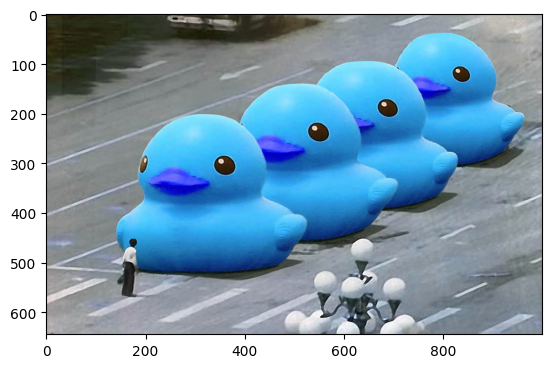

In [2]:
image = cv2.imread('duck_tanks.jpeg')
plt.imshow(image)

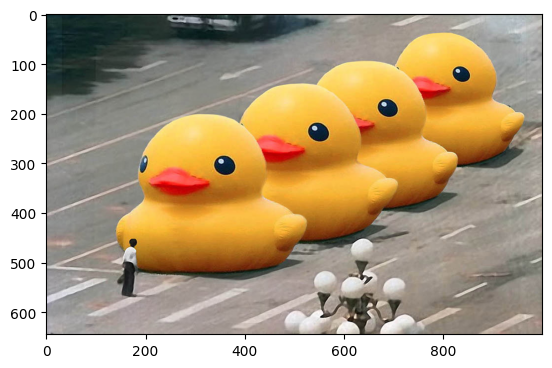

In [3]:
image_ex = image[...,::-1]
plt.imshow(image_ex)

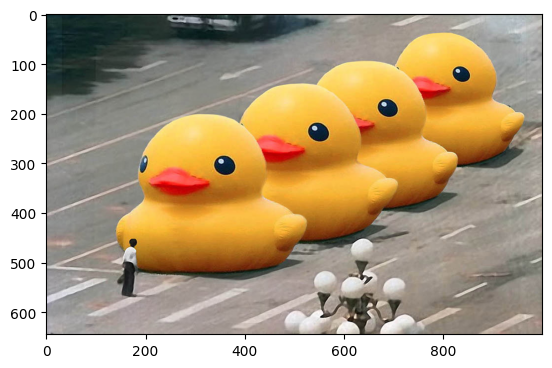

In [4]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)

Посмотрим на каналы изображения отдельно

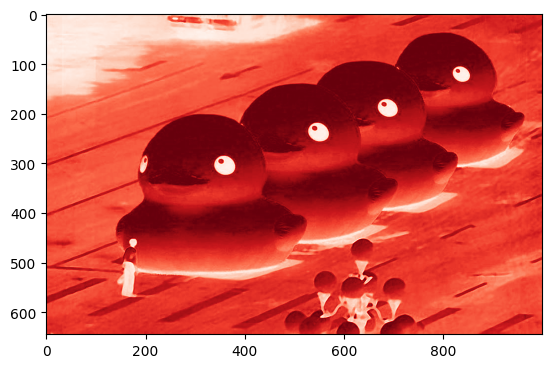

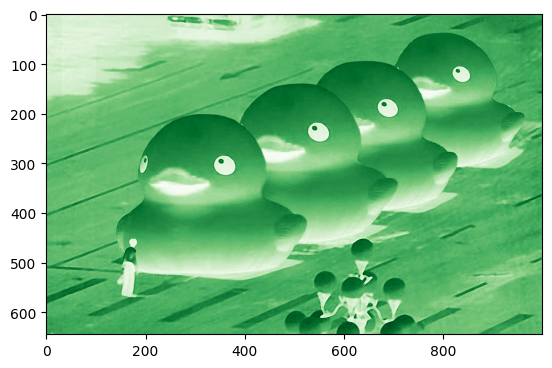

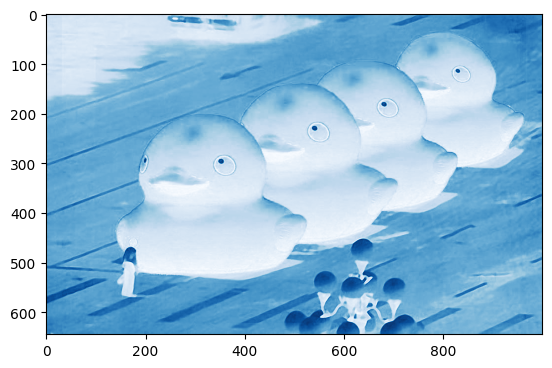

In [5]:
img_mat = np.array(image_rgb)
plt.imshow(img_mat[:, :, 0], cmap=cm.Reds)
plt.show()

img_mat = np.array(image_rgb)
plt.imshow(img_mat[:, :, 1], cmap=cm.Greens)
plt.show()

img_mat = np.array(image_rgb)
plt.imshow(img_mat[:, :, 2], cmap=cm.Blues)
plt.show()

# Операция свертки

- Количество входных каналов `in_channels`
- Количество выходных каналов `out_channels`
- Размер ядра `kernel_size`
- Шаг `stride`
- Паддинг `padding`
- Режим паддинга `padding_mode` (`'zeros'`, `'reflect'`, ...)
![alt text](conv.png "")

In [6]:
bw_image = cv2.imread('./duck_tanks.jpeg', cv2.IMREAD_GRAYSCALE)

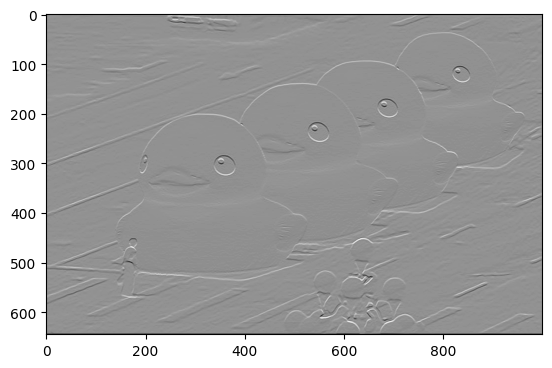

In [7]:
from scipy.signal import convolve2d

G_y = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
])

res_y = convolve2d(bw_image, G_y, "same")
plt.imshow(res_y, cmap=plt.cm.Greys_r)

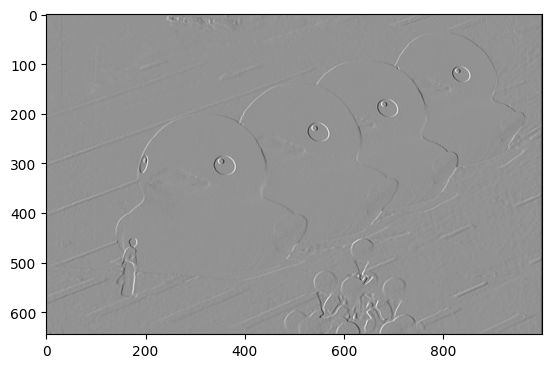

In [8]:
G_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

res_x = convolve2d(bw_image, G_y.T, "same")
plt.imshow(res_x, cmap=plt.cm.Greys_r)

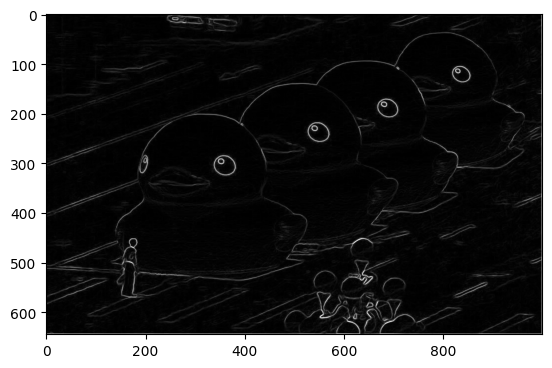

In [9]:
res_sobel = (res_x**2 + res_y**2)**0.5
plt.imshow(res_sobel, cmap=plt.cm.Greys_r)

# Пулинг

In [10]:
import numpy as np

conv_output = np.array([
    [10, 12,  8,  7],
    [ 4, 11,  5,  9],
    [18, 13,  7,  7],
    [ 3, 15,  2,  2]
])
conv_output

array([[10, 12,  8,  7],
       [ 4, 11,  5,  9],
       [18, 13,  7,  7],
       [ 3, 15,  2,  2]])

Сначала попробуем со `stride=2`

![alt text](pool.png "")

In [11]:
pool_size = 2
stride = 2

def get_pools(img=conv_output, pool_size=2, stride=2):

    pools = []
    for i in np.arange(conv_output.shape[0], step=stride):
        for j in np.arange(conv_output.shape[0], step=stride):
            mat = conv_output[i:i+pool_size, j:j+pool_size]
            pools.append(mat)
    pools = np.array(pools)
    return pools

pools = get_pools()
pools

array([[[10, 12],
        [ 4, 11]],

       [[ 8,  7],
        [ 5,  9]],

       [[18, 13],
        [ 3, 15]],

       [[ 7,  7],
        [ 2,  2]]])

In [12]:
def max_pooling(pools: np.array) -> np.array:

    num_pools = pools.shape[0]

    # Размер матрицы после пулинга
    tgt_shape = (int(np.sqrt(num_pools)), int(np.sqrt(num_pools)))

    # Здесь будем хранить максимумы с каждого из пулов
    pooled = []
    for pool in pools:
        pooled.append(np.max(pool))

    return np.array(pooled).reshape(tgt_shape)

In [13]:
max_pooling(pools=pools)

array([[12,  9],
       [18,  7]])

# Сверточная нейронная сеть

In [14]:
import torch
import torch.nn.functional as F
import torchvision
from torch import nn
from tqdm import tqdm

import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [15]:
transform = torchvision.transforms.Compose(
    [
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.1307,), (0.3081,))
    ]
)

In [16]:
mnist_train = torchvision.datasets.MNIST(
    './mnist/',
    train=True,
    download=True,
    transform=transform
)
train_dataset = torch.utils.data.TensorDataset(
    torch.unsqueeze(mnist_train.train_data, 1).to(device, dtype = torch.float),
                              mnist_train.train_labels.to(device))

mnist_val = torchvision.datasets.MNIST(
    './mnist/',
    train=False,
    download=True,
    transform=transform
)
test_dataset = torch.utils.data.TensorDataset(
    torch.unsqueeze(mnist_val.test_data, 1).to(device, dtype = torch.float),
                              mnist_val.test_labels.to(device))

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=True)

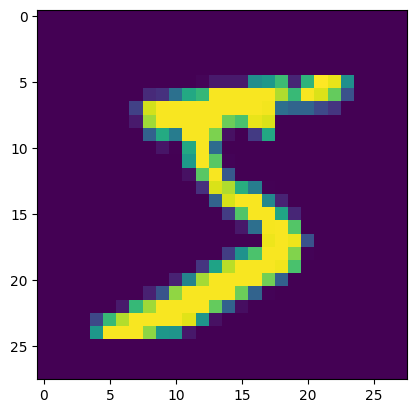

In [17]:
plt.imshow(train_dataset[0][0].squeeze(0).cpu().numpy().reshape([28, 28]))

In [18]:
model = nn.Sequential(
    nn.Flatten(),
    nn.Linear(28*28, 128),
    nn.ReLU(),
    nn.Linear(128, 10)
).to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

In [19]:
def train(model, optimizer, n_epochs=5):
    for epoch in range(n_epochs):

        # обучение
        for x_train, y_train in tqdm(train_dataloader):
            y_pred = model(x_train)
            loss = F.cross_entropy(y_pred, y_train)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        # валидация
        if epoch % 2 == 0:
            val_loss = []
            val_accuracy = []
            with torch.no_grad():
                for x_val, y_val in tqdm(val_dataloader):
                    y_pred = model(x_val)
                    loss = F.cross_entropy(y_pred, y_val)
                    val_loss.append(loss.cpu().numpy())
                    val_accuracy.extend((torch.argmax(y_pred, dim=-1) == y_val).cpu().numpy().tolist())

            print(f'Epoch: {epoch}, loss: {np.mean(val_loss)}, accuracy: {np.mean(val_accuracy)}')

In [20]:
train(model, optimizer)

100%|██████████| 157/157 [00:00<00:00, 879.30it/s]


Epoch: 0, loss: 1.3002362251281738, accuracy: 0.5351


100%|██████████| 157/157 [00:00<00:00, 625.04it/s]


Epoch: 2, loss: 1.4103434085845947, accuracy: 0.4617


100%|██████████| 157/157 [00:00<00:00, 974.04it/s]

Epoch: 4, loss: 2.2329812049865723, accuracy: 0.3346


In [21]:
model = nn.Sequential(
    nn.Conv2d(in_channels=1, out_channels=10, kernel_size=5),  # grayscale
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=4),   # сократим изображение в 4 раза по каждой из сторон
    nn.Flatten(),
    nn.Linear(6*6*10, 128),
    nn.ReLU(),
    nn.Linear(128, 10)
).to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

In [22]:
train(model, optimizer)

100%|██████████| 157/157 [00:00<00:00, 931.80it/s]


Epoch: 0, loss: 2.1740970611572266, accuracy: 0.2334


100%|██████████| 157/157 [00:00<00:00, 939.45it/s]


Epoch: 2, loss: 0.7557864785194397, accuracy: 0.7609


100%|██████████| 157/157 [00:00<00:00, 926.79it/s]

Epoch: 4, loss: 0.387254536151886, accuracy: 0.8824


# Домашнее задание

Обучите сверточную нейронную сеть на датасете MNIST, взяв любой другой оптимизатор (кроме SGD) и любую другую функцию ошибки (кроме cross-entropy loss). Попробуйте поварьировать параметры: кол-во ядер, `kernel_size` и побить текущий бейзлайн в `0.9746`. Выведите количество обучаемых параметров.    
Какого качества удалось достичь? Попробуйте залоггировать Ваши результаты - построить графики того, как менялись метрики качества (accuracy, loss) с течением эпох, включить логгирование, сравнить результаты между собой при разных параметрах.

Любые дополнительные улучшения (как по методам, так и по коду пайплайна) приветствуются!

*Цель:* выработать навык обучения нейронных сетей (в частности сверточных) на основе средств PyTorch, начиная от загрузки датасетами и заканчивая выводами результатов, их логгированием, сравнением и анализом.

In [23]:
%load_ext tensorboard
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [24]:
def train_search(model, optimizer, loss_fun, run_type: str, run_name: str, writer: SummaryWriter, n_epochs=5, ohe = False):
    for epoch in range(n_epochs):
        # обучение
        for x_train, y_train in tqdm(train_dataloader):
            y_pred = model(x_train)
            if ohe:
                y_train_ohe = torch.nn.functional.one_hot(y_train, 10).float()
                loss = loss_fun(y_pred, y_train_ohe)
            else:
                loss = loss_fun(y_pred, y_train)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        # валидация
        val_loss = []
        val_accuracy = []
        with torch.no_grad():
            for x_val, y_val in tqdm(val_dataloader):
                y_pred = model(x_val)
                if ohe:
                    y_val_ohe = torch.nn.functional.one_hot(y_val, 10).float()
                    loss = loss_fun(y_pred, y_val_ohe)
                else:
                    loss = loss_fun(y_pred, y_val)
                val_loss.append(loss.cpu().numpy())
                val_accuracy.extend((torch.argmax(y_pred, dim=-1) == y_val).cpu().numpy().tolist())

        print(f'Epoch: {epoch}, loss: {np.mean(val_loss)}, accuracy: {np.mean(val_accuracy)}')
        writer.add_scalars(run_type+'/losses', {run_name: np.mean(val_loss)}, epoch)
        writer.add_scalars(run_type+'/accuracies', {run_name: np.mean(val_accuracy)}, epoch)

In [25]:
def train_new(loss, optim, writer: SummaryWriter, type_name: str, run_name: str, ohe = False) -> None:
    print(run_name)
    model = nn.Sequential(
        nn.Conv2d(in_channels=1, out_channels=10, kernel_size=5),  # grayscale
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=4),   # сократим изображение в 4 раза по каждой из сторон
        nn.Flatten(),
        nn.Linear(6*6*10, 128),
        nn.ReLU(),
        nn.Linear(128, 10)
    ).to(device)

    optimizer = optim(model.parameters())

    train_search(model, optimizer, loss, type_name, run_name, writer, 10, ohe)

In [44]:
loss_fun_ce = F.cross_entropy
# loss_fun_nll = F.nll_loss

losses = [loss_fun_ce]
          # , #loss_fun_bce,
          # loss_fun_nll]
loss_names = ["cross entropy"]
# , #"binary cross entropy",
#                 "negative log likehood"]

# loss_fun_bce = F.binary_cross_entropy
# loss_fun_mse = F.mse_loss
# loss_fun_mae = F.l1_loss
# losses_ohe = [#loss_fun_bce,
#               loss_fun_mse, loss_fun_mae]
# loss_names_ohe = [#"binary cross entropy",
#                   "mse", "mae"]

optim_ada_delta = torch.optim.Adadelta
optim_ada_grad = torch.optim.Adagrad
optim_adam = torch.optim.Adam
optim_nadam = torch.optim.NAdam
optim_adamw = torch.optim.AdamW
optim_rmsprop = torch.optim.RMSprop

optims = [optim_ada_delta, optim_ada_grad, optim_adam,
          optim_nadam, optim_adamw, optim_rmsprop]
optim_names = ["ada_delta", "ada_grad", "adam", "nadam", "adamw", "rmsprop"]

In [45]:
for loss, name in zip(losses, loss_names):
    train_new(loss, optim_ada_delta, writer, "loss", name)

cross entropy


100%|██████████| 157/157 [00:00<00:00, 843.18it/s]


Epoch: 0, loss: 0.15487490594387054, accuracy: 0.9615


100%|██████████| 157/157 [00:00<00:00, 633.07it/s]


Epoch: 1, loss: 0.06999237090349197, accuracy: 0.9812


100%|██████████| 157/157 [00:00<00:00, 874.95it/s]


Epoch: 2, loss: 0.1037413477897644, accuracy: 0.9757


100%|██████████| 157/157 [00:00<00:00, 900.52it/s]


Epoch: 3, loss: 0.07727421075105667, accuracy: 0.9825


100%|██████████| 157/157 [00:00<00:00, 929.99it/s]


Epoch: 4, loss: 0.09055017679929733, accuracy: 0.9829


100%|██████████| 157/157 [00:00<00:00, 935.14it/s]


Epoch: 5, loss: 0.08439696580171585, accuracy: 0.9833


100%|██████████| 157/157 [00:00<00:00, 768.32it/s]


Epoch: 6, loss: 0.10970782488584518, accuracy: 0.9806


100%|██████████| 157/157 [00:00<00:00, 955.35it/s]


Epoch: 7, loss: 0.08475039154291153, accuracy: 0.983


100%|██████████| 157/157 [00:00<00:00, 902.34it/s]


Epoch: 8, loss: 0.09847810864448547, accuracy: 0.9826


100%|██████████| 157/157 [00:00<00:00, 964.90it/s]

Epoch: 9, loss: 0.09650705009698868, accuracy: 0.9846


In [46]:
# for loss, name in zip(losses_ohe, loss_names_ohe):
#     train_new(loss, optim_ada_delta, writer, "loss", name, ohe = True)

In [29]:
for optim, name in zip(optims, optim_names):
    loss = F.cross_entropy
    train_new(loss, optim, writer, "optimizer", name)

ada_delta


100%|██████████| 157/157 [00:00<00:00, 908.14it/s]


Epoch: 0, loss: 0.08608147501945496, accuracy: 0.9736


100%|██████████| 157/157 [00:00<00:00, 622.73it/s]


Epoch: 1, loss: 0.07117123156785965, accuracy: 0.98


100%|██████████| 157/157 [00:00<00:00, 956.51it/s]


Epoch: 2, loss: 0.07998347282409668, accuracy: 0.9789


100%|██████████| 157/157 [00:00<00:00, 965.31it/s]


Epoch: 3, loss: 0.07896675914525986, accuracy: 0.9807


100%|██████████| 157/157 [00:00<00:00, 906.16it/s]


Epoch: 4, loss: 0.07042672485113144, accuracy: 0.9841


100%|██████████| 157/157 [00:00<00:00, 961.23it/s]


Epoch: 5, loss: 0.10055772960186005, accuracy: 0.9818


100%|██████████| 157/157 [00:00<00:00, 951.77it/s]


Epoch: 6, loss: 0.14750954508781433, accuracy: 0.9747


100%|██████████| 157/157 [00:00<00:00, 652.00it/s]


Epoch: 7, loss: 0.10388436168432236, accuracy: 0.9805


100%|██████████| 157/157 [00:00<00:00, 941.53it/s]


Epoch: 8, loss: 0.08171301335096359, accuracy: 0.9844


100%|██████████| 157/157 [00:00<00:00, 966.84it/s]


Epoch: 9, loss: 0.12036202102899551, accuracy: 0.9835
ada_grad


100%|██████████| 157/157 [00:00<00:00, 1001.62it/s]


Epoch: 0, loss: 0.13789372146129608, accuracy: 0.9585


100%|██████████| 157/157 [00:00<00:00, 940.27it/s]


Epoch: 1, loss: 0.10711510479450226, accuracy: 0.9661


100%|██████████| 157/157 [00:00<00:00, 825.74it/s]


Epoch: 2, loss: 0.0927392840385437, accuracy: 0.9707


100%|██████████| 157/157 [00:00<00:00, 916.02it/s]


Epoch: 3, loss: 0.08369733393192291, accuracy: 0.9745


100%|██████████| 157/157 [00:00<00:00, 921.04it/s]


Epoch: 4, loss: 0.07776616513729095, accuracy: 0.9754


100%|██████████| 157/157 [00:00<00:00, 973.19it/s] 


Epoch: 5, loss: 0.07536149770021439, accuracy: 0.9767


100%|██████████| 157/157 [00:00<00:00, 864.05it/s]


Epoch: 6, loss: 0.06777450442314148, accuracy: 0.9784


100%|██████████| 157/157 [00:00<00:00, 931.21it/s]


Epoch: 7, loss: 0.07030093669891357, accuracy: 0.9785


100%|██████████| 157/157 [00:00<00:00, 849.14it/s]


Epoch: 8, loss: 0.06450261920690536, accuracy: 0.9789


100%|██████████| 157/157 [00:00<00:00, 1007.76it/s]


Epoch: 9, loss: 0.06877897679805756, accuracy: 0.9787
adam


100%|██████████| 157/157 [00:00<00:00, 924.25it/s]


Epoch: 0, loss: 0.11191942542791367, accuracy: 0.9655


100%|██████████| 157/157 [00:00<00:00, 929.75it/s]


Epoch: 1, loss: 0.0680561289191246, accuracy: 0.979


100%|██████████| 157/157 [00:00<00:00, 916.40it/s]


Epoch: 2, loss: 0.07149629294872284, accuracy: 0.9799


100%|██████████| 157/157 [00:00<00:00, 675.21it/s]


Epoch: 3, loss: 0.06923144310712814, accuracy: 0.9803


100%|██████████| 157/157 [00:00<00:00, 937.10it/s]


Epoch: 4, loss: 0.06439433991909027, accuracy: 0.9808


100%|██████████| 157/157 [00:00<00:00, 851.57it/s]


Epoch: 5, loss: 0.06566855311393738, accuracy: 0.9821


100%|██████████| 157/157 [00:00<00:00, 946.83it/s]


Epoch: 6, loss: 0.08008534461259842, accuracy: 0.9802


100%|██████████| 157/157 [00:00<00:00, 958.91it/s]


Epoch: 7, loss: 0.0641644224524498, accuracy: 0.9832


100%|██████████| 157/157 [00:00<00:00, 930.47it/s]


Epoch: 8, loss: 0.08146478980779648, accuracy: 0.9814


100%|██████████| 157/157 [00:00<00:00, 622.00it/s]


Epoch: 9, loss: 0.08625035732984543, accuracy: 0.9803
nadam


100%|██████████| 157/157 [00:00<00:00, 941.08it/s]


Epoch: 0, loss: 0.09898485988378525, accuracy: 0.969


100%|██████████| 157/157 [00:00<00:00, 957.36it/s]


Epoch: 1, loss: 0.06987199187278748, accuracy: 0.9776


100%|██████████| 157/157 [00:00<00:00, 938.23it/s]


Epoch: 2, loss: 0.06338703632354736, accuracy: 0.9801


100%|██████████| 157/157 [00:00<00:00, 971.72it/s]


Epoch: 3, loss: 0.06737487018108368, accuracy: 0.9813


100%|██████████| 157/157 [00:00<00:00, 675.16it/s]


Epoch: 4, loss: 0.08192514628171921, accuracy: 0.9773


100%|██████████| 157/157 [00:00<00:00, 958.25it/s]


Epoch: 5, loss: 0.06933273375034332, accuracy: 0.9781


100%|██████████| 157/157 [00:00<00:00, 980.96it/s]


Epoch: 6, loss: 0.1060214713215828, accuracy: 0.9746


100%|██████████| 157/157 [00:00<00:00, 1004.39it/s]


Epoch: 7, loss: 0.08754658699035645, accuracy: 0.9785


100%|██████████| 157/157 [00:00<00:00, 962.46it/s]


Epoch: 8, loss: 0.09233033657073975, accuracy: 0.9793


100%|██████████| 157/157 [00:00<00:00, 932.22it/s]


Epoch: 9, loss: 0.08977745473384857, accuracy: 0.9795
adamw


100%|██████████| 157/157 [00:00<00:00, 640.41it/s]


Epoch: 0, loss: 0.11172618716955185, accuracy: 0.9645


100%|██████████| 157/157 [00:00<00:00, 948.70it/s]


Epoch: 1, loss: 0.0802261158823967, accuracy: 0.9742


100%|██████████| 157/157 [00:00<00:00, 936.05it/s]


Epoch: 2, loss: 0.07264842092990875, accuracy: 0.977


100%|██████████| 157/157 [00:00<00:00, 931.09it/s]


Epoch: 3, loss: 0.0617506317794323, accuracy: 0.9799


100%|██████████| 157/157 [00:00<00:00, 970.96it/s]


Epoch: 4, loss: 0.06367386132478714, accuracy: 0.9797


100%|██████████| 157/157 [00:00<00:00, 871.23it/s]


Epoch: 5, loss: 0.07352738827466965, accuracy: 0.9782


100%|██████████| 157/157 [00:00<00:00, 993.26it/s]


Epoch: 6, loss: 0.08836810290813446, accuracy: 0.9751


100%|██████████| 157/157 [00:00<00:00, 811.05it/s]


Epoch: 7, loss: 0.08326087892055511, accuracy: 0.9778


100%|██████████| 157/157 [00:00<00:00, 918.79it/s]


Epoch: 8, loss: 0.060343001037836075, accuracy: 0.984


100%|██████████| 157/157 [00:00<00:00, 972.11it/s]


Epoch: 9, loss: 0.07883352786302567, accuracy: 0.9794
rmsprop


100%|██████████| 157/157 [00:00<00:00, 915.12it/s]


Epoch: 0, loss: 0.46675634384155273, accuracy: 0.8657


100%|██████████| 157/157 [00:00<00:00, 681.33it/s]


Epoch: 1, loss: 0.25869765877723694, accuracy: 0.9295


100%|██████████| 157/157 [00:00<00:00, 914.87it/s]


Epoch: 2, loss: 0.28547781705856323, accuracy: 0.9302


100%|██████████| 157/157 [00:00<00:00, 941.69it/s]


Epoch: 3, loss: 0.4557197690010071, accuracy: 0.9108


100%|██████████| 157/157 [00:00<00:00, 979.07it/s] 


Epoch: 4, loss: 0.23430322110652924, accuracy: 0.9455


100%|██████████| 157/157 [00:00<00:00, 995.53it/s]


Epoch: 5, loss: 0.25839880108833313, accuracy: 0.939


100%|██████████| 157/157 [00:00<00:00, 988.92it/s]


Epoch: 6, loss: 0.26874420046806335, accuracy: 0.9492


100%|██████████| 157/157 [00:00<00:00, 631.28it/s]


Epoch: 7, loss: 0.3104957044124603, accuracy: 0.9202


100%|██████████| 157/157 [00:00<00:00, 932.61it/s]


Epoch: 8, loss: 0.26065731048583984, accuracy: 0.952


100%|██████████| 157/157 [00:00<00:00, 963.11it/s]

Epoch: 9, loss: 0.3149830400943756, accuracy: 0.9417


In [30]:
writer.close()

In [31]:
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

In [68]:
def train_final(model, optimizer, n_epochs=5):
    loss_fun =F.nll_loss
    losses = []
    accs = []
    m = nn.LogSoftmax(dim=1)
    for epoch in range(n_epochs):
        # обучение
        for x_train, y_train in tqdm(train_dataloader):
            y_pred = model(x_train)
            loss = loss_fun(m(y_pred), y_train)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        # валидация
        val_loss = []
        val_accuracy = []
        with torch.no_grad():
            for x_val, y_val in tqdm(val_dataloader):
                y_pred = model(x_val)
                loss = loss_fun(m(y_pred), y_val)
                val_loss.append(loss.cpu().numpy())
                val_accuracy.extend((torch.argmax(y_pred, dim=-1) == y_val).cpu().numpy().tolist())

        print(f'Epoch: {epoch}, loss: {np.mean(val_loss)}, accuracy: {np.mean(val_accuracy)}')
        losses.append(np.mean(val_loss))
        accs.append(np.mean(val_accuracy))
    return losses, accs


model = nn.Sequential(
	nn.Conv2d(in_channels=1, out_channels=10, kernel_size=3),  # grayscale
	nn.ReLU(),
	nn.MaxPool2d(kernel_size=2),   # сократим изображение в 4 раза по каждой из сторон
	nn.Flatten(),
	nn.Linear(13*13*10, 128),
	nn.ReLU(),
	nn.Linear(128, 10)
).to(device)

optim = torch.optim.Adadelta(model.parameters())

In [70]:
losses, accuracies = train_final(model, optim, 10)

100%|██████████| 157/157 [00:00<00:00, 945.89it/s]


Epoch: 0, loss: 0.14270639419555664, accuracy: 0.9791


100%|██████████| 157/157 [00:00<00:00, 937.67it/s]


Epoch: 1, loss: 0.12180411070585251, accuracy: 0.9837


100%|██████████| 157/157 [00:00<00:00, 852.60it/s]


Epoch: 2, loss: 0.14425300061702728, accuracy: 0.9851


100%|██████████| 157/157 [00:00<00:00, 311.00it/s]


Epoch: 3, loss: 0.1493133008480072, accuracy: 0.984


100%|██████████| 157/157 [00:00<00:00, 892.98it/s]


Epoch: 4, loss: 0.17504872381687164, accuracy: 0.9833


100%|██████████| 157/157 [00:00<00:00, 891.36it/s]


Epoch: 5, loss: 0.16545839607715607, accuracy: 0.984


100%|██████████| 157/157 [00:00<00:00, 478.86it/s]


Epoch: 6, loss: 0.16820205748081207, accuracy: 0.9839


100%|██████████| 157/157 [00:00<00:00, 903.20it/s]


Epoch: 7, loss: 0.17466875910758972, accuracy: 0.9838


100%|██████████| 157/157 [00:00<00:00, 904.10it/s]


Epoch: 8, loss: 0.17581038177013397, accuracy: 0.9839


100%|██████████| 157/157 [00:00<00:00, 399.28it/s]

Epoch: 9, loss: 0.17635223269462585, accuracy: 0.984


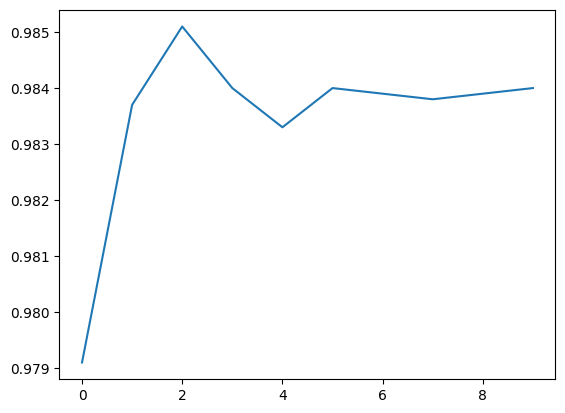

In [72]:
plt.plot(accuracies)

Итого получил точность 0.984 изменив размер ядер свёртки и max-pooling, применив negative likelihood loss и adagrad optimizer. Проанализировал различные оптимизаторы и функции ошибки с помощью tensorboard (для разных функций ошибки приходилось менять фунцию обучения, так что здесь запускается только для двух: crossentropy и финальной nll)